####  NOTE: You have to run predict_validation (in train folder) before running this analysis.

In [1]:
import glob
import os
import sys

import SimpleITK as sitk
import matplotlib.pyplot as plt
import numpy as np
from ipywidgets import widgets
from matplotlib import colors
from scipy.spatial.distance import cdist

In [93]:
cmap = colors.ListedColormap(['orange', 'red'])
cmap_ground_truth = colors.ListedColormap(['lime'])
cmap_pred = colors.ListedColormap(['yellow'])
cmap_pink = colors.ListedColormap(['pink', 'red'])
cmap_red = colors.ListedColormap(['crimson'])
cmap_black = colors.ListedColormap(['black'])
%matplotlib inline

In [3]:
module_root = '..'
sys.path.append(module_root)
from settings import train_folder

In [4]:
train_folder = '/home/mehrtash/dropbox/qanat_v2/intermediate/train/'

## Select Model Folder

In [7]:
model_list = sorted(os.listdir(train_folder))
model_list.remove('board_logs')
# model_list.remove('archive')
model_dropdown = widgets.Dropdown(
    options=model_list,
    value=model_list[-1],
    description='source: ',
)
display(model_dropdown)

Dropdown(description='source: ', index=4, options=('2019_07_16_11_13_21', '2019_07_16_11_13_24', '2019_07_16_2…

In [8]:
val_pred_folder = os.path.join(train_folder, model_dropdown.value, 'validation_predictions')
labels = sorted(glob.glob( val_pred_folder + '/*_label.nrrd'))
print('no of labels: {}'.format(len(labels)))
labels_dropdown = widgets.Dropdown(
    options=labels,
    value=labels[0],
    description='label: ',
)
display(labels_dropdown)

no of labels: 2


Dropdown(description='label: ', options=('/home/mehrtash/dropbox/qanat_v2/intermediate/train/2019_07_16_11_13_…

In [52]:
label_path = labels_dropdown.value
#
image = sitk.ReadImage(label_path.replace('_label.nrrd', '.nrrd'))
image_nda = sitk.GetArrayFromImage(image)
#
label = sitk.ReadImage(label_path)
label_border = sitk.BinaryDilate(label, 2)
label_nda = sitk.GetArrayFromImage(label)
label_nda = np.ma.masked_where(label_nda== 0, label_nda)
label_nda_border = sitk.GetArrayFromImage(label_border)
label_nda_border = np.ma.masked_where(label_nda_border== 0, label_nda_border)
#
pred = sitk.ReadImage(label_path.replace('_label.nrrd', '_pred.nrrd'))
pred_nda = sitk.GetArrayFromImage(pred)

In [53]:
print(np.amax(pred_nda))
print(np.mean(pred_nda[pred_nda>1]))

529.0
222.80601829914858


In [54]:
lower_bound_th = 250 
pred_th = sitk.BinaryThreshold(pred, lower_bound_th, 1000, 1, 0)
pred_th_border = sitk.BinaryDilate(pred_th, 2)

In [55]:
pred_nda = sitk.GetArrayFromImage(pred_th)
pred_nda_border = sitk.GetArrayFromImage(pred_th_border)
np.amax(pred_nda)

1

In [56]:
pred_nda = np.ma.masked_where(pred_nda==0, pred_nda)
pred_nda_border = np.ma.masked_where(pred_nda_border==0, pred_nda_border)

In [63]:
ccf = sitk.ConnectedComponentImageFilter()
ccf.SetFullyConnected(True)
ccf_labelmap_true = ccf.Execute(label)
stats_filter = sitk.LabelStatisticsImageFilter()
stats_filter.Execute(ccf_labelmap_true, ccf_labelmap_true)
labels_true= list(stats_filter.GetLabels())
labels_true.remove(0)
#
ccf_labelmap_pred = ccf.Execute(pred_th)
stats_filter.Execute(ccf_labelmap_pred, ccf_labelmap_pred)
labels_pred = list(stats_filter.GetLabels())
labels_pred.remove(0)

In [64]:
print(len(labels_true))
print(len(labels_pred))

1126
1153


In [65]:
def get_centroid(ccf_labelmap):
    stats_filter = sitk.LabelStatisticsImageFilter()
    stats_filter.Execute(ccf_labelmap, ccf_labelmap)
    labels = list(stats_filter.GetLabels())
    labels.remove(0)
    shape_stats_filter = sitk.LabelShapeStatisticsImageFilter()
    shape_stats_filter.SetBackgroundValue(0)
    shape_stats_filter.ComputeFeretDiameterOn()
    shape_stats_filter.Execute(ccf_labelmap)
    centroids = np.zeros((len(labels), 2))
    for index, label_val in enumerate(labels):
        centroids[index,0], centroids[index,1]  = shape_stats_filter.GetCentroid(label_val)
    return labels, centroids

In [66]:
pred_labels, pred_centroid = get_centroid(ccf_labelmap_pred)
true_labels, true_centroid = get_centroid(ccf_labelmap_true)

In [87]:
ccf_nda = sitk.GetArrayFromImage(ccf_labelmap_true)
ccf_pred_nda = sitk.GetArrayFromImage(ccf_labelmap_pred)

In [88]:
distances = cdist(true_centroid, pred_centroid)

In [89]:
distances.shape

(1126, 1153)

In [90]:
min_distance = 10
tp_points = np.min(distances, axis=0) < min_distance
tp = np.sum(tp_points)
fp = len(labels_true) - tp
fn = len(labels_pred) - tp

In [92]:
tp_nda = np.copy(ccf_nda)
fp_nda = np.copy(ccf_pred_nda)
for index, label_value in enumerate(labels_true):
    if tp_points[index]:
        tp_nda[tp_nda==label_value] = 0
        fp_nda[tp_nda==label_value] = 0
tp_nda = np.ma.masked_where(tp_nda==0, tp_nda)
fp_nda = np.ma.masked_where(fp_nda==0, fp_nda)

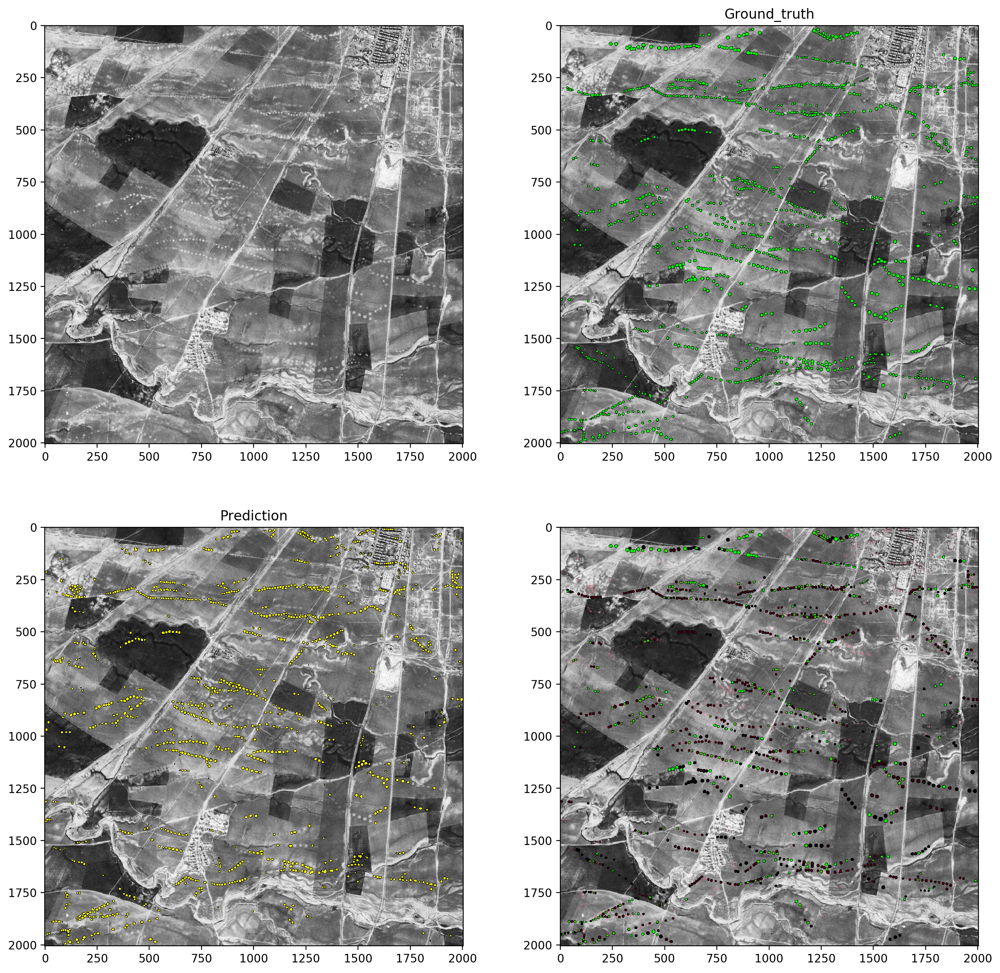

In [95]:
plt.figure(figsize=(15,15), dpi=200)
plt.subplot(221)
plt.imshow(image_nda, cmap=plt.cm.gray)
plt.subplot(222)
plt.imshow(image_nda, cmap=plt.cm.gray)
plt.imshow(label_nda_border, cmap=cmap_black)
plt.imshow(label_nda, alpha=1, cmap=cmap_ground_truth)
plt.title('Ground_truth')
plt.subplot(223)
plt.title('Prediction')
plt.imshow(image_nda, cmap=plt.cm.gray)
plt.imshow(pred_nda_border, cmap=cmap_black)
plt.imshow(pred_nda, cmap=cmap_pred)
plt.subplot(224)
plt.imshow(image_nda, cmap=plt.cm.gray)
plt.imshow(label_nda_border, cmap=cmap_black)
plt.imshow(tp_nda, cmap=cmap_ground_truth)
plt.imshow(fp_nda, cmap=cmap_red,alpha=0.3)

In [96]:
precision = (tp)/(tp + fp)
recall = (tp)/(tp + fn)
f1 = (2*tp)/ (2*tp + fp +fn)
print('tp: {}, fp: {}, fn: {}'.format(tp, fp, fn))
print('precision: {0:0.2f}, recall: {1:0.2f}, f1: {2:0.2f}'.format(precision, recall, f1))

tp: 766, fp: 360, fn: 387
precision: 0.68, recall: 0.66, f1: 0.67


In [97]:
neighbors_true = np.argmin(distances, axis=0)+1
neighbors_pred = np.argmin(distances, axis=1)+1

In [121]:
neighbors_true

array([   5,    5,   66, ..., 1124, 1122, 1125])

In [99]:
print(len(neighbors_true))
print(neighbors_pred)
print(len(neighbors_pred))

[   5    5   66 ... 1124 1122 1125]
1153
[  12   15   16 ... 1151 1153 1153]
1126


In [98]:
def dice_coefficient(label_true, label_pred, label_val_true, label_val_pred):
    nda_true = sitk.GetArrayFromImage(label_true)
    nda_pred = sitk.GetArrayFromImage(label_pred)
    nda_true[nda_true != label_val_true] = 0
    nda_true[nda_true == label_val_true] = 1
    nda_pred[nda_pred != label_val_pred] = 0
    nda_pred[nda_pred == label_val_pred] = 1
    y_true = nda_true.flatten()
    y_pred = nda_pred.flatten()
    intersection = np.sum(y_true * y_pred)
    return (2. * intersection) / (np.sum(y_true) + np.sum(y_pred))

In [100]:
dc_true = np.zeros(len(neighbors_true))
for index, neighbor in enumerate(neighbors_true):
    dc_true[index] = dice_coefficient(ccf_labelmap_true, ccf_labelmap_pred, neighbor, index+1)

In [101]:
dc_pred = np.zeros(len(neighbors_pred))
for index, neighbor in enumerate(neighbors_pred):
    dc_pred[index] = dice_coefficient(ccf_labelmap_true, ccf_labelmap_pred, index+1, neighbor)

In [102]:
dice_threshold = 0
tp = np.sum(dc_true>dice_threshold)
fn = np.sum(dc_true<=dice_threshold)
print('true positive: {}'.format(tp))
print('false negative: {}'.format(fn))

true positive: 738
false negative: 415


In [112]:
dice_threshold = 0
fp = np.sum(dc_pred<=dice_threshold)
print('false positives: {}'.format(fp))

false positives: 372


In [113]:
tp_points = dc_true>dice_threshold
fp_points = dc_pred<=dice_threshold

In [114]:
precision = (tp)/(tp + fp)
recall = (tp)/(tp + fn)
f1 = (2*tp)/ (2*tp + fp +fn)
print('precision: {0:0.2f}, recall: {1:0.2f}, f1: {2:0.2f}'.format(precision, recall, f1))

precision: 0.66, recall: 0.64, f1: 0.65


In [118]:
len(labels_true)

1126

In [115]:
tp_nda = np.copy(ccf_nda)
fp_nda = np.copy(ccf_pred_nda)
for index, label_value in enumerate(labels_true):
    if tp_points[index]:
        tp_nda[tp_nda==label_value] = 0
        fp_nda[tp_nda==label_value] = 0
tp_nda = np.ma.masked_where(tp_nda==0, tp_nda)
fp_nda = np.ma.masked_where(fp_nda==0, fp_nda)

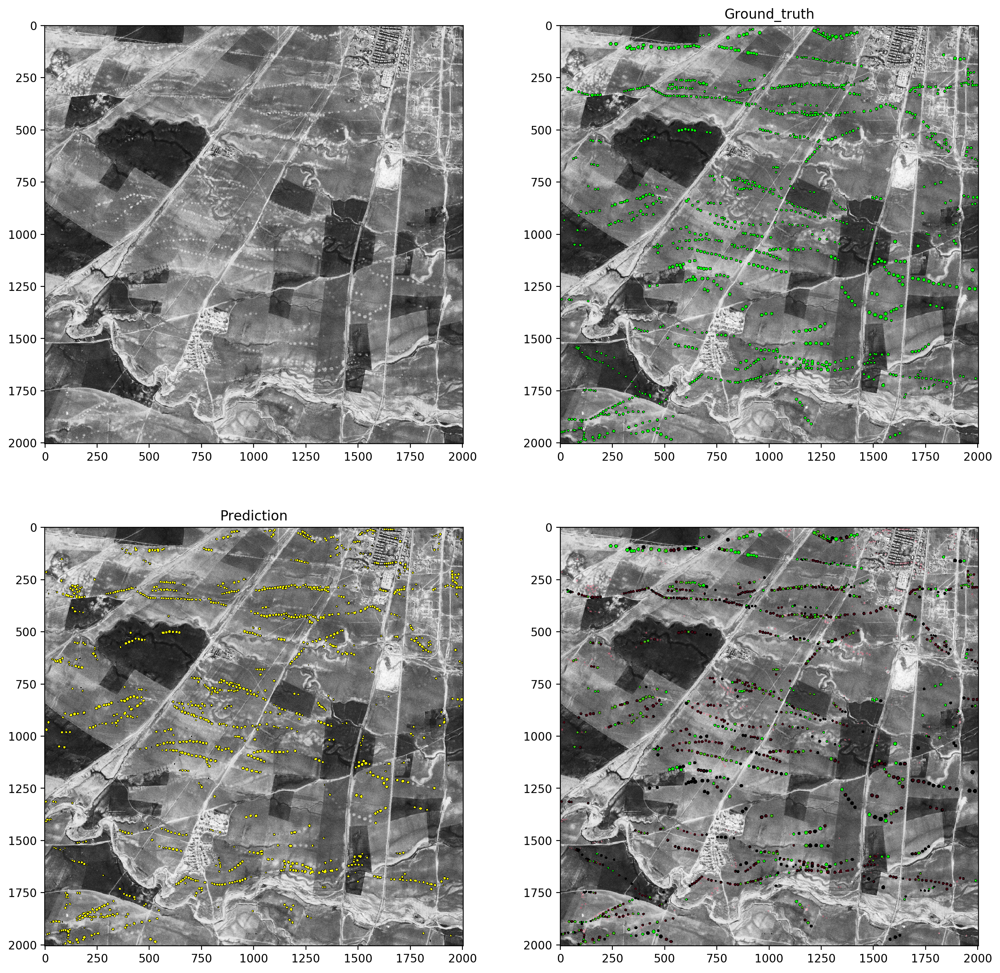

In [116]:
plt.figure(figsize=(15,15), dpi=200)
plt.subplot(221)
plt.imshow(image_nda, cmap=plt.cm.gray)
plt.subplot(222)
plt.imshow(image_nda, cmap=plt.cm.gray)
plt.imshow(label_nda_border, cmap=cmap_black)
plt.imshow(label_nda, alpha=1, cmap=cmap_ground_truth)
plt.title('Ground_truth')
plt.subplot(223)
plt.title('Prediction')
plt.imshow(image_nda, cmap=plt.cm.gray)
plt.imshow(pred_nda_border, cmap=cmap_black)
plt.imshow(pred_nda, cmap=cmap_pred)
plt.subplot(224)
plt.imshow(image_nda, cmap=plt.cm.gray)
plt.imshow(label_nda_border, cmap=cmap_black)
plt.imshow(tp_nda, cmap=cmap_ground_truth)
plt.imshow(fp_nda, cmap=cmap_red,alpha=0.3)